In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list, ward
from scipy.spatial.distance import pdist
import pickle
import neuro_morpho_toolbox as nmt

D:\ProgramData\Anaconda3\envs\neuronbeta\lib\site-packages\neuro_morpho_toolbox-0.1-py3.7.egg\neuro_morpho_toolbox\
Loading CCF Atlas data...
Loading time: 0.90
Loading CCF brain structure data...
Loading time: 0.04
Loading selected CCF Atlas and Contour data...
Loading time: 8.91


In [2]:
def get_node_region(point):
    p = point[['x', 'y', 'z']].copy()
    p['x'] = p['x'] / nmt.annotation.space['x']
    p['y'] = p['y'] / nmt.annotation.space['y']
    p['z'] = p['z'] / nmt.annotation.space['z']
    p = p.round(0).astype(int)
    if ((p.x.iloc[0] >= 0) & (p.x.iloc[0] < nmt.annotation.size['x']) &
            (p.y.iloc[0] >= 0) & (p.y.iloc[0] < nmt.annotation.size['y']) &
            (p.z.iloc[0] >= 0) & (p.z.iloc[0] < nmt.annotation.size['z'])
    ):
        region_id = nmt.annotation.array[p.x.iloc[0],
                                         p.y.iloc[0],
                                         p.z.iloc[0]]
        if region_id in list(nmt.bs.dict_to_selected.keys()):
            region_id = nmt.bs.dict_to_selected[region_id]
            region = nmt.bs.id_to_name(region_id)
            return region

    return 'unknow'

In [3]:
label_df = pd.read_csv('../final_data/3002_cell_soma.csv', sep=',', index_col=0)
label_df['region'] = label_df.apply(lambda r: get_node_region(pd.DataFrame({'x': [r.x], 'y': [r.y], 'z': [r.z]})), axis=1)
label_df.index = [i.split('.')[0] for i in label_df.index]
label_df

,type,x,y,z,r,parent,region
17109_1701_x8048_y22277,1,2820.175,3990.050,7795.550,1.0,-1,AId
17109_1801_x6698_y12550,1,3003.125,3453.775,4191.800,1.0,-1,ORBl
17109_1901_x9602_y10508,1,3183.950,4764.250,3375.825,1.0,-1,AIv
17109_2201_x8046_y23301,1,3479.625,3790.725,8126.500,1.0,-1,MOp
17109_2301_x8535_y23051,1,3562.350,4013.725,8007.975,1.0,-1,AId
...,...,...,...,...,...,...,...
pre_18866_00186,1,9014.500,3195.725,2810.000,1.0,-1,DG
pre_18866_00299,1,8793.700,4237.000,2382.125,1.0,-1,DG
pre_18866_01458,1,8035.300,2626.400,7929.675,1.0,-1,DG
pre_18868_00443,1,3882.700,2516.325,7802.225,1.0,-1,MOp


In [4]:
with open(r'D:\2022\whole_brain_con\final_data\connectivity_results\Allen_Janelia_re10um_single_cell_level_summaryz_unfilpped.pickle', 'rb') as f:
    data_dict = pickle.load(f)
data_dict.keys()

dict_keys(['mean', 'mean.adj', 'numAxonNods'])

In [5]:
cur_type = 'mean'
df = data_dict[cur_type].copy()
df.index = [i.split('.')[0] for i in df.index]
df

,18454_00111,18455_00121,AA0264,18453_3186_x12745_y7108,18457_00141,pre_18464_00077,18453_7132_x31679_y7308,18458_00450,18465_00349,AA0663,...,AA0755,AA0329,AA0517,191807_2469_x5431_y10056,AA0783,18454_00096,17545_00030,191812_3140_x5204_y12992,AA0652,18454_01114
17109_1701_x8048_y22277,4022.758,4026.889,6623.628,3763.113,3655.655,3511.729,7363.473,5092.904,6103.497,2729.285,...,4483.802,2268.701,9561.127,2886.677,1830.465,3502.621,3489.561,2771.527,2608.569,5213.932
17109_1801_x6698_y12550,4297.405,3768.383,6068.489,4259.282,4122.757,3293.980,7207.940,4787.801,6134.379,2012.486,...,4451.173,2041.396,9344.343,3257.821,1615.785,3479.501,3347.647,2439.186,1862.572,5104.470
17109_1901_x9602_y10508,3897.135,4228.314,7027.316,3479.656,3356.588,3664.790,7570.290,5347.339,6188.512,3004.680,...,4599.532,2040.048,9828.343,2639.354,1625.510,3575.898,3607.970,3061.743,2935.312,5387.434
17109_2201_x8046_y23301,4671.629,3795.627,6281.025,4327.380,4334.130,3199.947,6939.334,4859.088,6644.708,3015.183,...,4910.145,2626.276,9625.682,3701.000,2155.151,3862.976,2912.753,3600.487,2822.390,5685.428
17109_2301_x8535_y23051,3106.871,4454.496,6850.620,3633.578,3175.651,4098.912,7727.346,5368.708,5034.010,3342.285,...,3913.625,3091.240,9077.708,2807.270,2656.052,3378.051,4255.096,2593.276,3187.563,4413.114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pre_18866_00186,3981.381,5547.274,6294.405,4917.189,4937.648,5998.034,7279.263,5256.516,1823.825,6642.688,...,2292.725,7307.619,4700.138,5848.314,6572.923,3566.704,6970.787,5071.451,5911.079,1429.886
pre_18866_00299,4125.318,5751.831,6617.549,4778.014,4998.748,6238.298,7208.544,5418.305,1696.820,7214.348,...,2344.160,7738.886,4234.461,6119.960,6925.790,3734.674,7224.209,5668.988,6411.092,1615.810
pre_18866_01458,6535.606,1616.140,1637.950,6095.092,6798.590,2053.768,3349.632,1268.419,6715.038,4220.543,...,4470.657,5288.833,6349.095,6786.634,4499.687,3585.875,2691.934,5280.569,3335.708,5104.146
pre_18868_00443,5248.184,2974.203,5271.856,4849.138,5065.348,2342.523,6415.359,4099.535,6933.029,1250.587,...,4869.311,1549.570,9372.698,4235.860,995.284,3618.721,2090.360,3101.291,998.646,5658.071


In [6]:
# src=r'D:\datasets\test.csv'
# df=pd.read_csv(src, index_col=0)
# df.index = [i.split('.')[0] for i in df.index]
# df.columns = [i.split('.')[0] for i in df.columns]
sele_list = list(set(label_df.index).intersection(set(df.columns)))
label_df = label_df.loc[sele_list, :]
df = df.loc[sele_list, sele_list]
df

,AA0469,AA0005,AA0033,AA0899,AA1090,18869_00020,18455_00147,18457_00143,18462_00024,18465_00303,...,18454_00015,AA0438,AA0029,AA0019,AA1073,AA0662,AA0357,18458_00541,182725_4290_x5671_y18488,AA0536
AA0469,-2.000,4015.903,5431.755,3613.930,5459.407,6185.297,3304.128,4234.699,4831.432,4814.614,...,3241.904,3330.455,3585.173,3485.392,5727.291,4299.761,3898.560,4473.294,3729.236,5242.246
AA0005,3819.504,-2.000,5412.501,3229.113,5308.447,7187.174,4107.542,2752.190,5570.631,3863.385,...,4212.760,3343.670,2325.736,2687.304,6068.677,3261.245,2308.957,3107.638,2946.287,5848.084
AA0033,7172.270,6054.965,-2.000,6457.326,2091.944,3782.027,3872.978,5128.427,2617.672,4855.755,...,5099.974,5515.251,5171.090,5235.210,4206.634,5269.979,4674.566,4927.593,4767.164,2377.252
AA0899,4791.687,3731.774,3067.465,-2.000,3124.624,4052.432,1244.260,2864.200,2682.915,2986.280,...,2772.204,2211.600,2419.902,2230.789,3395.020,3706.305,2375.120,2844.447,2862.066,2991.326
AA1090,5281.549,4131.990,3640.022,4448.225,-2.000,4282.654,2195.499,3273.857,3330.811,3312.143,...,3370.952,2370.277,2842.033,2597.222,3574.657,4279.736,2920.858,3265.251,3470.779,3554.072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AA0662,2905.717,2258.193,4821.327,2361.856,4670.847,7143.725,3748.976,3755.987,5038.982,4791.115,...,3422.682,3968.210,2929.557,3361.353,6465.722,-2.000,2934.108,4045.479,1378.535,5384.298
AA0357,6544.701,3929.527,4046.694,5893.407,3853.326,5724.642,4645.111,2979.675,4905.859,2866.303,...,5967.541,4364.346,3540.844,3769.618,4333.832,4871.486,-2.000,2803.341,4453.268,4764.856
18458_00541,6100.578,2453.573,6426.116,5514.623,6306.395,7578.892,5545.954,1883.366,6826.243,2630.053,...,6529.779,3331.106,2753.887,2926.174,5680.448,5530.035,2250.818,-2.000,5142.860,6877.401
182725_4290_x5671_y18488,6032.919,5390.778,4190.686,5241.433,4243.961,4264.373,3458.847,4702.472,3904.255,4527.616,...,4264.888,4246.918,4467.317,4370.490,3821.594,4761.113,4367.165,4630.919,-2.000,4010.534


In [7]:
all_values = df.values.reshape(-1,1)
all_scaled = 1-MinMaxScaler().fit_transform(all_values)
all_scaled = all_scaled.reshape(df.values.shape)
all_values.shape

(8934121, 1)

In [8]:
all_scaled.reshape(-1)

array([1.        , 0.66913422, 0.55254182, ..., 0.68065601, 0.61149968,
       1.        ])

In [9]:
df_scale = pd.DataFrame(all_scaled, index=df.index, columns=df.columns)
df_scale

,AA0469,AA0005,AA0033,AA0899,AA1090,18869_00020,18455_00147,18457_00143,18462_00024,18465_00303,...,18454_00015,AA0438,AA0029,AA0019,AA1073,AA0662,AA0357,18458_00541,182725_4290_x5671_y18488,AA0536
AA0469,1.000000,0.669134,0.552542,0.702236,0.550265,0.490489,0.727747,0.651117,0.601977,0.603362,...,0.732871,0.725579,0.704604,0.712821,0.528205,0.645759,0.678797,0.631469,0.692741,0.568147
AA0005,0.685307,1.000000,0.554127,0.733925,0.562696,0.407987,0.661588,0.773198,0.541106,0.681694,...,0.652923,0.724491,0.808316,0.778542,0.500093,0.731279,0.809698,0.743928,0.757215,0.518258
AA0033,0.409214,0.501222,1.000000,0.468088,0.827568,0.688393,0.680904,0.577520,0.784276,0.599974,...,0.579863,0.545666,0.574007,0.568727,0.653428,0.565864,0.614895,0.594058,0.607269,0.804074
AA0899,0.605250,0.692532,0.747236,1.000000,0.742529,0.666126,0.897373,0.763975,0.778903,0.753921,...,0.771550,0.817715,0.800562,0.816135,0.720263,0.694629,0.804249,0.765601,0.764150,0.753506
AA1090,0.564911,0.659575,0.700087,0.633533,1.000000,0.647168,0.819041,0.730240,0.725550,0.727087,...,0.722245,0.804648,0.765800,0.785960,0.705470,0.647408,0.759309,0.730949,0.714024,0.707165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AA0662,0.760556,0.813878,0.602809,0.805341,0.615201,0.411565,0.691115,0.690538,0.584886,0.605297,...,0.717985,0.673062,0.758593,0.723035,0.467397,1.000000,0.758218,0.666699,0.886316,0.556450
AA0357,0.460893,0.676247,0.666599,0.514526,0.682522,0.528423,0.617320,0.754465,0.595848,0.763801,...,0.508421,0.640441,0.708254,0.689415,0.642953,0.598679,1.000000,0.768986,0.633118,0.607460
18458_00541,0.497466,0.797789,0.470658,0.545718,0.480517,0.375730,0.543138,0.844744,0.437709,0.783256,...,0.462122,0.725526,0.773059,0.758871,0.532062,0.544449,0.814485,1.000000,0.576332,0.433496
182725_4290_x5671_y18488,0.503037,0.555916,0.654741,0.568214,0.650354,0.648673,0.715007,0.612597,0.678328,0.626996,...,0.648631,0.650111,0.631961,0.639935,0.685135,0.607768,0.640209,0.618489,1.000000,0.669576


In [10]:
regioncounts = label_df['region'].value_counts()
label_df = label_df[label_df.region.isin(regioncounts[regioncounts>30].index)]
print(len(label_df['region'].value_counts()))
label_df

21


,type,x,y,z,r,parent,region
AA0469,1,2464.362305,1942.457031,6842.882813,1.0,-1,MOs
AA0005,1,4481.646784,2314.060963,3973.648517,1.0,-1,MOp
AA0899,1,3172.347614,2425.811969,6813.581227,1.0,-1,MOs
18455_00147,1,6637.975000,4192.225000,7538.450000,1.0,-1,VPM
18457_00143,1,6533.600000,3859.400000,3768.050000,1.0,-1,VPL
...,...,...,...,...,...,...,...
AA0029,1,5604.548454,3681.256036,4686.491908,1.0,-1,fiber tracts
AA0662,1,4527.819583,1209.053257,7150.010137,1.0,-1,MOp
18458_00541,1,7004.575000,3900.025000,3818.050000,1.0,-1,VPM
182725_4290_x5671_y18488,1,4998.725000,1943.950000,7039.850000,1.0,-1,MOp


### 对行排序

In [11]:
# row_df = df_scale.T.copy()
# x=row_df.values
# print('raw x shape: ',x.shape)
# Z = linkage(x, 'centroid')
# fig = plt.figure(figsize=(25, 10))
# dn = dendrogram(Z)
# new_index = leaves_list(Z)
# row_df = row_df.iloc[new_index,:]
# print('row_df shape: ', row_df.shape)
# df_scale = df_scale[row_df.T.columns]
# print(df_scale.shape)

### 对列排序

In [12]:
# col_df = df_scale.copy()
# x=col_df.values
# print(x.shape)
# Z = linkage(x, 'centroid')
# fig = plt.figure(figsize=(25, 10))
# dn = dendrogram(Z)
# new_index = leaves_list(Z)
# col_df = col_df.iloc[new_index,:]
# df_scale = df_scale.loc[col_df.index, :]
# print(df_scale.shape)

In [13]:
majorRegion2color = {'CTX': 'r', 'CNU': 'b', 'TH': 'g', 'HY': 'y', 'MB': 'c', 'HB': 'm'}
detailRegion2rough = {}
roughRegion2detail = {'CNU':[], 'CTX':[], 'TH':{}, 'MB':[], 'HY':[], 'HB':[]}
for i in roughRegion2detail.keys():
    roughRegion2detail[i] = [nmt.bs.id_to_name(j) for j in nmt.bs.get_all_child_id(i)]

for k,v in roughRegion2detail.items():
    for vi in v:
        detailRegion2rough[vi] = k
label_df['majorRegion'] = label_df.apply(lambda r: detailRegion2rough[r.region] if r.region \
                                                   in detailRegion2rough.keys() else 'unknown', axis=1)
label_df = label_df.loc[~label_df.majorRegion.isin(['unknown']),:]
# label_df['c'] = label_df['majorRegion'].map(majorRegion2color)
label_df

,type,x,y,z,r,parent,region,majorRegion
AA0469,1,2464.362305,1942.457031,6842.882813,1.0,-1,MOs,CTX
AA0005,1,4481.646784,2314.060963,3973.648517,1.0,-1,MOp,CTX
AA0899,1,3172.347614,2425.811969,6813.581227,1.0,-1,MOs,CTX
18455_00147,1,6637.975000,4192.225000,7538.450000,1.0,-1,VPM,TH
18457_00143,1,6533.600000,3859.400000,3768.050000,1.0,-1,VPL,TH
...,...,...,...,...,...,...,...,...
18454_00015,1,4903.250000,3800.275000,8524.950000,1.0,-1,CP,CNU
AA0662,1,4527.819583,1209.053257,7150.010137,1.0,-1,MOp,CTX
18458_00541,1,7004.575000,3900.025000,3818.050000,1.0,-1,VPM,TH
182725_4290_x5671_y18488,1,4998.725000,1943.950000,7039.850000,1.0,-1,MOp,CTX


In [14]:
sele_regions = [nmt.bs.id_to_name(i) for i in nmt.bs.selected_regions]
order_list = []
for i in sele_regions:
    tmp_index = label_df[label_df.region==i].index
    if len(order_list) == 0:
        order_list = list(tmp_index)
    else:
        order_list = order_list+list(tmp_index)
# order_rows
df_scale = df_scale.loc[order_list, order_list]

label_df = label_df.loc[order_list]
label_df

,type,x,y,z,r,parent,region,majorRegion
AA0005,1,4481.646784,2314.060963,3973.648517,1.0,-1,MOp,CTX
AA0649,1,4400.716797,2021.682617,7121.257813,1.0,-1,MOp,CTX
AA1539,1,4163.950707,2690.893251,7769.966353,1.0,-1,MOp,CTX
AA0009,1,4941.393264,1385.279340,3667.473946,1.0,-1,MOp,CTX
pre_18864_00286,1,4772.050000,1416.500000,3865.125000,1.0,-1,MOp,CTX
...,...,...,...,...,...,...,...,...
AA0330,1,7116.918945,5137.761718,4288.570312,1.0,-1,ZI,HY
18462_00032,1,7843.200000,4727.825000,6942.050000,1.0,-1,ZI,HY
18465_00229,1,7423.475000,4435.150000,7871.125000,1.0,-1,ZI,HY
18462_00063,1,7362.175000,4846.550000,3624.500000,1.0,-1,ZI,HY


In [15]:
sele_index = label_df[label_df.majorRegion=='CTX'].index
vis_data = df_scale.loc[sele_index]
vis_label = label_df.loc[sele_index]
vis_label

,type,x,y,z,r,parent,region,majorRegion
AA0005,1,4481.646784,2314.060963,3973.648517,1.0,-1,MOp,CTX
AA0649,1,4400.716797,2021.682617,7121.257813,1.0,-1,MOp,CTX
AA1539,1,4163.950707,2690.893251,7769.966353,1.0,-1,MOp,CTX
AA0009,1,4941.393264,1385.279340,3667.473946,1.0,-1,MOp,CTX
pre_18864_00286,1,4772.050000,1416.500000,3865.125000,1.0,-1,MOp,CTX
...,...,...,...,...,...,...,...,...
AA0843,1,8806.557379,2178.650851,8018.740933,1.0,-1,SUB,CTX
AA0709,1,9245.028938,3209.390911,8691.373027,1.0,-1,SUB,CTX
AA0489,1,8611.586913,2372.960938,7711.234376,1.0,-1,SUB,CTX
AA0704,1,9083.192689,2757.548766,8717.466264,1.0,-1,SUB,CTX


In [16]:
vis_regioncounts = vis_label.region.value_counts()
vis_regioncounts[vis_regioncounts>10].index

Index(['MOs', 'MOp', 'SUB', 'DG', 'SSs', 'SSp-m', 'PRE', 'SSp-bfd', 'SSp-ul',
       'AId', 'ACAd'],
      dtype='object')

In [17]:
color_list = (sns.palettes.color_palette('tab20').as_hex() + sns.palettes.color_palette('Set2').as_hex())
print(len(color_list))

28


In [18]:
28%28

0

In [19]:
r2c = {}
for k,i in  enumerate(label_df['region'].unique()):
    k = k%28
    r2c[i] = color_list[k]

In [20]:
vis_label = vis_label[vis_label.region.isin(vis_regioncounts[vis_regioncounts>10].index)]
vis_label['c'] = vis_label['region'].map(r2c)
vis_data = vis_data.loc[vis_label.index]

vis_label

,type,x,y,z,r,parent,region,majorRegion,c
AA0005,1,4481.646784,2314.060963,3973.648517,1.0,-1,MOp,CTX,#1f77b4
AA0649,1,4400.716797,2021.682617,7121.257813,1.0,-1,MOp,CTX,#1f77b4
AA1539,1,4163.950707,2690.893251,7769.966353,1.0,-1,MOp,CTX,#1f77b4
AA0009,1,4941.393264,1385.279340,3667.473946,1.0,-1,MOp,CTX,#1f77b4
pre_18864_00286,1,4772.050000,1416.500000,3865.125000,1.0,-1,MOp,CTX,#1f77b4
...,...,...,...,...,...,...,...,...,...
AA0843,1,8806.557379,2178.650851,8018.740933,1.0,-1,SUB,CTX,#8c564b
AA0709,1,9245.028938,3209.390911,8691.373027,1.0,-1,SUB,CTX,#8c564b
AA0489,1,8611.586913,2372.960938,7711.234376,1.0,-1,SUB,CTX,#8c564b
AA0704,1,9083.192689,2757.548766,8717.466264,1.0,-1,SUB,CTX,#8c564b


In [21]:
vis_label['region'].unique()

array(['MOp', 'MOs', 'SSp-bfd', 'SSp-m', 'SSp-ul', 'SSs', 'ACAd', 'AId',
       'DG', 'PRE', 'SUB'], dtype=object)

In [22]:
label_df['c'] = label_df['region'].map(r2c)
label_df

,type,x,y,z,r,parent,region,majorRegion,c
AA0005,1,4481.646784,2314.060963,3973.648517,1.0,-1,MOp,CTX,#1f77b4
AA0649,1,4400.716797,2021.682617,7121.257813,1.0,-1,MOp,CTX,#1f77b4
AA1539,1,4163.950707,2690.893251,7769.966353,1.0,-1,MOp,CTX,#1f77b4
AA0009,1,4941.393264,1385.279340,3667.473946,1.0,-1,MOp,CTX,#1f77b4
pre_18864_00286,1,4772.050000,1416.500000,3865.125000,1.0,-1,MOp,CTX,#1f77b4
...,...,...,...,...,...,...,...,...,...
AA0330,1,7116.918945,5137.761718,4288.570312,1.0,-1,ZI,HY,#17becf
18462_00032,1,7843.200000,4727.825000,6942.050000,1.0,-1,ZI,HY,#17becf
18465_00229,1,7423.475000,4435.150000,7871.125000,1.0,-1,ZI,HY,#17becf
18462_00063,1,7362.175000,4846.550000,3624.500000,1.0,-1,ZI,HY,#17becf


In [23]:
label_df['region'].unique()

array(['MOp', 'MOs', 'SSp-bfd', 'SSp-m', 'SSp-ul', 'SSs', 'ACAd', 'AId',
       'DG', 'PRE', 'SUB', 'CP', 'VAL', 'VPL', 'VPM', 'MG', 'LGd', 'RT',
       'ZI'], dtype=object)

In [24]:
vis_data

,AA0005,AA0649,AA1539,AA0009,pre_18864_00286,AA0224,191812_2978_x7903_y22705,191812_3801_x5383_y20989,18869_4184_x11041_y4195,18868_3658_x9598_y8113,...,AA0177,18462_00029,18465_00234,18463_00036,AA0904,AA0330,18462_00032,18465_00229,18462_00063,18867_4789_x23709_y15765
AA0005,1.000000,0.749515,0.713313,0.846081,0.847023,0.869710,0.624617,0.711215,0.760576,0.691415,...,0.692180,0.600127,0.599687,0.613583,0.696345,0.687527,0.618074,0.608813,0.681968,0.728202
AA0649,0.661174,1.000000,0.738296,0.610179,0.614704,0.658780,0.694564,0.742515,0.768342,0.730463,...,0.766916,0.872639,0.861687,0.876269,0.781042,0.776356,0.885873,0.864373,0.717190,0.779554
AA1539,0.543777,0.604415,1.000000,0.500231,0.500585,0.539589,0.566304,0.605040,0.636956,0.595257,...,0.696613,0.807066,0.788670,0.791712,0.712518,0.716374,0.812019,0.784580,0.673522,0.699337
AA0009,0.916547,0.721351,0.662147,1.000000,0.956559,0.881600,0.553633,0.669647,0.750720,0.643025,...,0.668997,0.557444,0.550018,0.562741,0.674504,0.669621,0.583902,0.560416,0.680626,0.706166
pre_18864_00286,0.918421,0.756508,0.707974,0.901213,1.000000,0.897086,0.607275,0.707002,0.768465,0.684689,...,0.669709,0.567883,0.565971,0.580891,0.676722,0.663486,0.588251,0.576011,0.663325,0.713350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AA0843,0.506408,0.628471,0.600243,0.500287,0.498356,0.492403,0.553765,0.639023,0.690749,0.629683,...,0.578786,0.796278,0.803006,0.762368,0.596612,0.601873,0.787648,0.801819,0.573804,0.574190
AA0709,0.690888,0.767941,0.768494,0.629812,0.637589,0.694820,0.728828,0.763812,0.790474,0.753468,...,0.771592,0.820956,0.827891,0.844636,0.776485,0.767353,0.821523,0.833191,0.700815,0.796796
AA0489,0.679933,0.729324,0.699661,0.657194,0.658190,0.671457,0.632366,0.720154,0.781177,0.700780,...,0.707190,0.765972,0.764112,0.760989,0.716118,0.712990,0.774420,0.768488,0.679190,0.726306
AA0704,0.703915,0.781617,0.773434,0.648145,0.655426,0.705142,0.723523,0.774485,0.810416,0.761513,...,0.766573,0.824822,0.830629,0.844684,0.774986,0.766497,0.827615,0.837235,0.706518,0.790877


<AxesSubplot:ylabel='Density'>

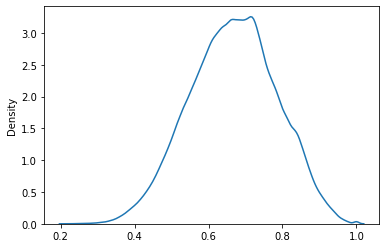

In [25]:
sns.kdeplot(vis_data.values.reshape(-1))

<AxesSubplot:>

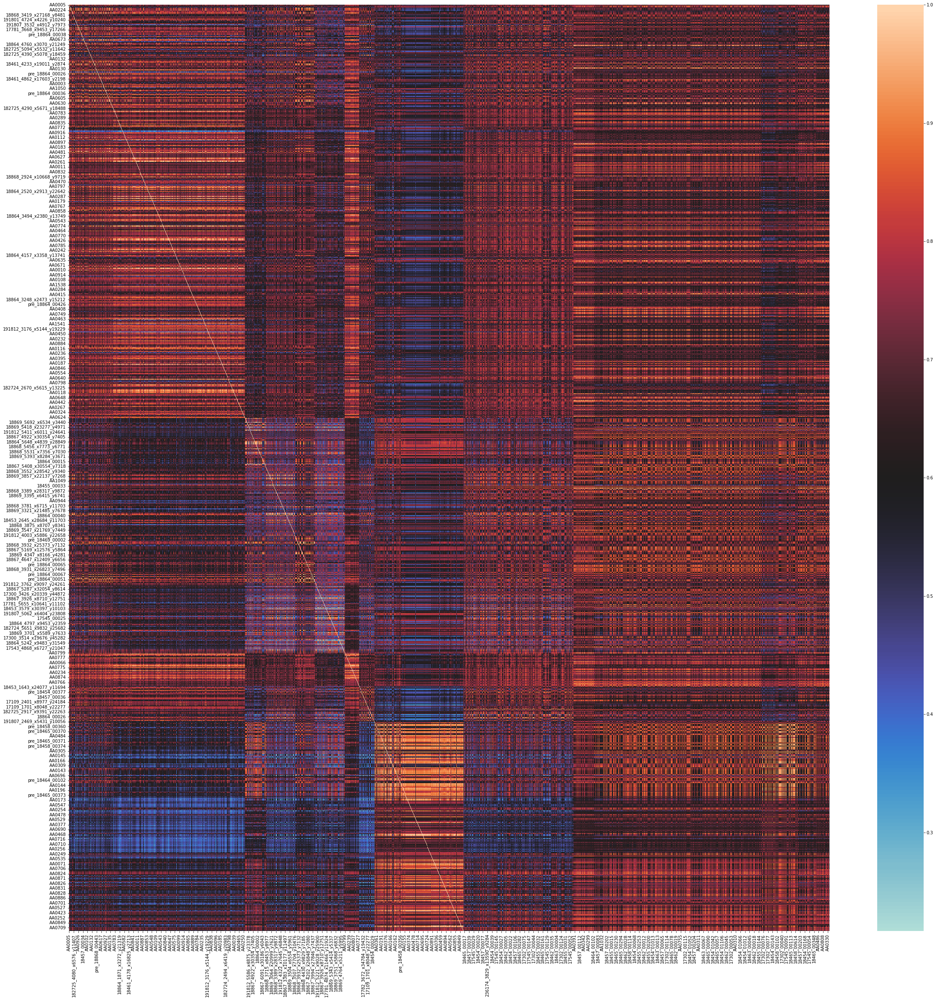

In [26]:
f, ax = plt.subplots(1,1, figsize=(40,40))
sns.heatmap(vis_data, ax=ax, center=0.6)
# plt.savefig('./300_cell_connectivity.jpg', dpi=200, bbox_inches='tight')

In [27]:
# 'CTX': 'r', 'CNU': 'b', 'TH': 'g', 'HY': 'y', 'MB': 'c', 'HB': 'm'

In [28]:
vis_data

,AA0005,AA0649,AA1539,AA0009,pre_18864_00286,AA0224,191812_2978_x7903_y22705,191812_3801_x5383_y20989,18869_4184_x11041_y4195,18868_3658_x9598_y8113,...,AA0177,18462_00029,18465_00234,18463_00036,AA0904,AA0330,18462_00032,18465_00229,18462_00063,18867_4789_x23709_y15765
AA0005,1.000000,0.749515,0.713313,0.846081,0.847023,0.869710,0.624617,0.711215,0.760576,0.691415,...,0.692180,0.600127,0.599687,0.613583,0.696345,0.687527,0.618074,0.608813,0.681968,0.728202
AA0649,0.661174,1.000000,0.738296,0.610179,0.614704,0.658780,0.694564,0.742515,0.768342,0.730463,...,0.766916,0.872639,0.861687,0.876269,0.781042,0.776356,0.885873,0.864373,0.717190,0.779554
AA1539,0.543777,0.604415,1.000000,0.500231,0.500585,0.539589,0.566304,0.605040,0.636956,0.595257,...,0.696613,0.807066,0.788670,0.791712,0.712518,0.716374,0.812019,0.784580,0.673522,0.699337
AA0009,0.916547,0.721351,0.662147,1.000000,0.956559,0.881600,0.553633,0.669647,0.750720,0.643025,...,0.668997,0.557444,0.550018,0.562741,0.674504,0.669621,0.583902,0.560416,0.680626,0.706166
pre_18864_00286,0.918421,0.756508,0.707974,0.901213,1.000000,0.897086,0.607275,0.707002,0.768465,0.684689,...,0.669709,0.567883,0.565971,0.580891,0.676722,0.663486,0.588251,0.576011,0.663325,0.713350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AA0843,0.506408,0.628471,0.600243,0.500287,0.498356,0.492403,0.553765,0.639023,0.690749,0.629683,...,0.578786,0.796278,0.803006,0.762368,0.596612,0.601873,0.787648,0.801819,0.573804,0.574190
AA0709,0.690888,0.767941,0.768494,0.629812,0.637589,0.694820,0.728828,0.763812,0.790474,0.753468,...,0.771592,0.820956,0.827891,0.844636,0.776485,0.767353,0.821523,0.833191,0.700815,0.796796
AA0489,0.679933,0.729324,0.699661,0.657194,0.658190,0.671457,0.632366,0.720154,0.781177,0.700780,...,0.707190,0.765972,0.764112,0.760989,0.716118,0.712990,0.774420,0.768488,0.679190,0.726306
AA0704,0.703915,0.781617,0.773434,0.648145,0.655426,0.705142,0.723523,0.774485,0.810416,0.761513,...,0.766573,0.824822,0.830629,0.844684,0.774986,0.766497,0.827615,0.837235,0.706518,0.790877


In [31]:
sns.set_theme(style="white", palette=None)

g = sns.clustermap(vis_data, cmap='Reds', col_cluster=False, row_cluster=False, 
                    col_colors=label_df['c'],
                    row_colors=vis_label['c'], 
                    figsize=(280,100),
                    center=0.7,
                    xticklabels = False,
                    yticklabels = False,
              )
# g.ax_heatmap.annotate(0,0,'hello',fontsize=50)
# (g.ax_row_colors.annotate('HB', (-300, 0), xycoords='axes points', fontsize=100, rotation=0))
# (g.ax_row_colors.annotate('MB', (-300, 100), xycoords='axes points', fontsize=100, rotation=0))
# (g.ax_row_colors.annotate('HY', (-300, 200), xycoords='axes points', fontsize=100, rotation=0))
# (g.ax_row_colors.annotate('TH', (-300, 1000), xycoords='axes points', fontsize=100, rotation=0))
# (g.ax_row_colors.annotate('CNU', (-300, 2200), xycoords='axes points', fontsize=100, rotation=0))
# (g.ax_row_colors.annotate('CTX', (-300, 4000), xycoords='axes points', fontsize=100, rotation=0))

# plt.savefig('./2k_'+ cur_type +'_cell_connectivity.jpg', dpi=200, bbox_inches='tight')